In [ ]:
import repaint
import os
import torch 
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from io import BytesIO
import PIL
import requests

In [6]:
!pip install diffusers ipywidgets accelerate transformers safetensors torch torchvision matplotlib -q

In [7]:
from diffusers import RePaintPipeline, RePaintScheduler
from diffusers import AutoPipelineForInpainting

RuntimeError: Failed to import diffusers.pipelines.deprecated.repaint.pipeline_repaint because of the following error (look up to see its traceback):
Failed to import diffusers.models.unets.unet_2d because of the following error (look up to see its traceback):
Failed to import diffusers.loaders.single_file_model because of the following error (look up to see its traceback):
cannot import name 'AutoImageProcessor' from 'transformers' (/home/kaifalam/miniconda3/envs/torch/lib/python3.9/site-packages/transformers/__init__.py)

In [ ]:
os.getcwd()

TypeError: posix.getcwd() takes no arguments (1 given)

In [ ]:
images_dir = './../imgs'
images = [os.path.join(images_dir, img) for img in os.listdir(images_dir) if img.endswith('.jpg') or img.endswith('.png')]
images

OSError: [Errno 116] Stale file handle: './../imgs'

In [8]:
img = './../imgs/eg_img_1.jpg'
mask1 = './../imgs/eg_img_1_masked_1.png'
mask2 = './../imgs/eg_img_1_masked_2.png'
output = './../imgs/eg_img_1_output_1.png'

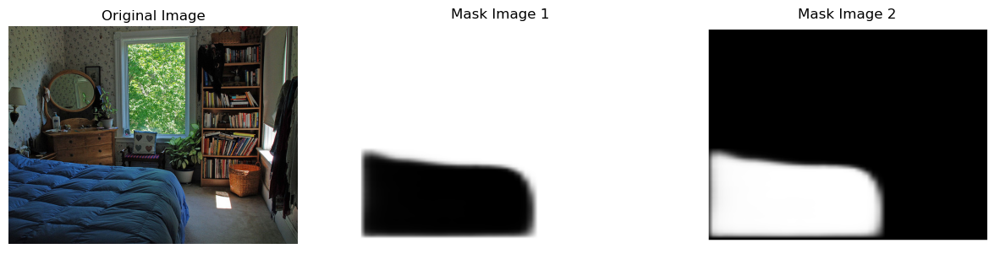

In [9]:
def plotimg(img):
    plt.imshow(np.array(img))
    plt.axis('off')
    plt.show()

def plot_3images(original, mask, inpainted, t1 = "Original Image", t2 = "Mask Image", t3 = "Inpainted Image"):
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(original)
    ax[0].set_title(t1)
    ax[0].axis('off')

    ax[1].imshow(mask)
    ax[1].set_title(t2)
    ax[1].axis('off')

    ax[2].imshow(inpainted)
    ax[2].set_title(t3)
    ax[2].axis('off')

    plt.show()

plot_3images(Image.open(img), Image.open(mask1), Image.open(mask2), "Original Image", "Mask Image 1", "Mask Image 2")

## Testing the RePaint Pipeline

> Using Model : GOOGLE's DDPM EMA CELEBA-HQ (256x256)

In [10]:
#  Code from : https://huggingface.co/docs/diffusers/v0.9.0/api/pipelines/repaint 

def download_image(url):
    response = requests.get(url)
    return PIL.Image.open(BytesIO(response.content)).convert("RGB")

img_url = "https://huggingface.co/datasets/hf-internal-testing/diffusers-images/resolve/main/repaint/celeba_hq_256.png"
mask_url = "https://huggingface.co/datasets/hf-internal-testing/diffusers-images/resolve/main/repaint/mask_256.png"

# Load the original image and the mask as PIL images
original_image = download_image(img_url).resize((256, 256))
mask_image = download_image(mask_url).resize((256, 256))

In [11]:
# Load the RePaint scheduler and pipeline based on a pretrained DDPM model
scheduler = RePaintScheduler.from_pretrained("google/ddpm-ema-celebahq-256")
pipe = RePaintPipeline.from_pretrained("google/ddpm-ema-celebahq-256", scheduler=scheduler)
pipe = pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/kaifalam/.cache/huggingface/hub/models--google--ddpm-ema-celebahq-256/snapshots/4cb6117472e6e4f45c5afe606b101858c27c3802: Error no file named diffusion_pytorch_model.safetensors found in directory /home/kaifalam/.cache/huggingface/hub/models--google--ddpm-ema-celebahq-256/snapshots/4cb6117472e6e4f45c5afe606b101858c27c3802.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


In [12]:
generator = torch.Generator(device="cuda").manual_seed(0)

In [13]:
output = pipe(
    image=original_image,
    mask_image=mask_image,
    num_inference_steps=250,
    eta=0.0,
    jump_length=10,
    jump_n_sample=10,
    generator=generator,
)
inpainted_image = output.images[0]

/home/kaifalam/miniconda3/envs/torch/lib/python3.9/site-packages/diffusers/pipelines/deprecated/repaint/pipeline_repaint.py:35: FutureWarning: The preprocess method is deprecated and will be removed in diffusers 1.0.0. Please use VaeImageProcessor.preprocess(...) instead
  deprecate("preprocess", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/4570 [00:00<?, ?it/s]

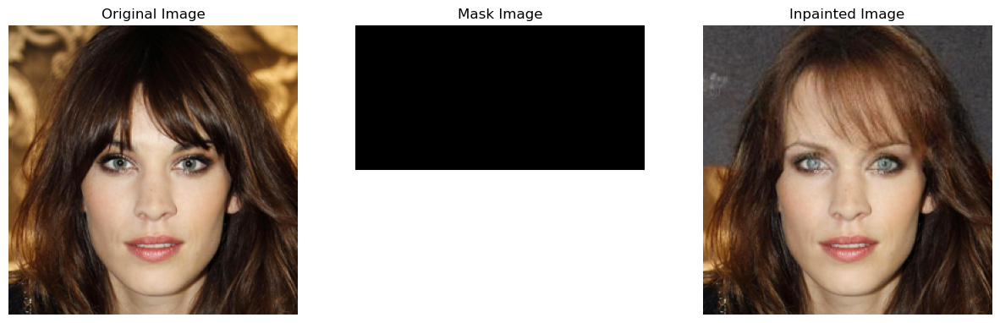

In [14]:
plot_3images(original_image, mask_image, inpainted_image)

## Why Inpainting fails since DDPM is trained on CelebA-HQ dataset:

In [21]:
original_image = Image.open(img).resize((256, 256))
mask_image = Image.open(mask1).resize((256, 256))

In [22]:
output = pipe(
    image=original_image,
    mask_image=mask_image,
    num_inference_steps=250,
    eta=0.0,
    jump_length=10,
    jump_n_sample=10,
    generator=generator,
)
inpainted_image = output.images[0]

/home/kaifalam/miniconda3/envs/torch/lib/python3.9/site-packages/diffusers/pipelines/deprecated/repaint/pipeline_repaint.py:35: FutureWarning: The preprocess method is deprecated and will be removed in diffusers 1.0.0. Please use VaeImageProcessor.preprocess(...) instead
  deprecate("preprocess", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/4570 [00:00<?, ?it/s]

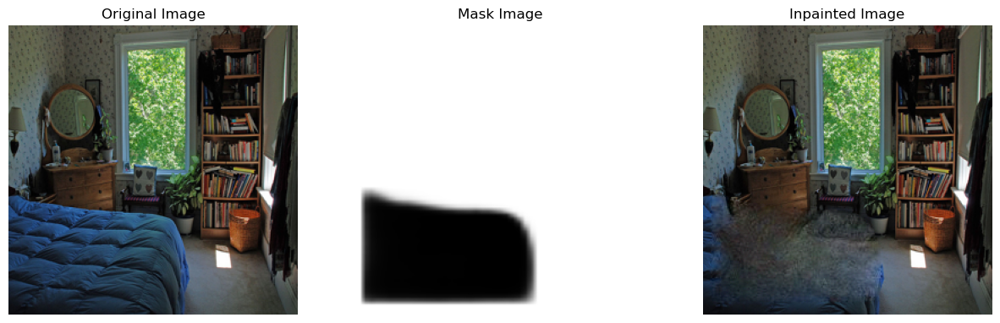

In [23]:
plot_3images(original_image, mask_image, inpainted_image)

## Use a General Inpainting 
> Using Model : stabilityai/stable-diffusion-xl-base-1.0

In [38]:
from diffusers.utils import load_image
from diffusers import AutoPipelineForInpainting

In [16]:
pipe = AutoPipelineForInpainting.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder-inpaint", 
    torch_dtype=torch.float16
)

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [17]:
pipe.enable_model_cpu_offload()
# pipe.enable_xformers_memory_efficient_attention()
pipe = pipe.to("cuda")

It seems like you have activated model offloading by calling `enable_model_cpu_offload`, but are now manually moving the pipeline to GPU. It is strongly recommended against doing so as memory gains from offloading are likely to be lost. Offloading automatically takes care of moving the individual components unet, scheduler, movq, prior_prior, prior_image_encoder, prior_text_encoder, prior_tokenizer, prior_scheduler, prior_image_processor to GPU when needed. To make sure offloading works as expected, you should consider moving the pipeline back to CPU: `pipeline.to('cpu')` or removing the move altogether if you use offloading.


In [35]:
input_image = load_image(img)
mask_image1  = load_image(mask1)
mask_image2  = load_image(mask2)

In [36]:
type(input_image), type(mask_image1), type(mask_image2)

(PIL.Image.Image, PIL.Image.Image, PIL.Image.Image)

In [19]:
output = pipe(
    prompt="",
    image=input_image,
    mask_image=mask_image2,
    num_inference_steps=50,
    guidance_scale=7.5,
).images[0]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

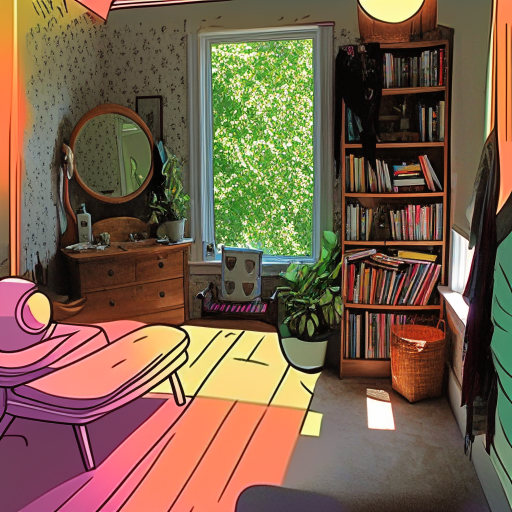

In [20]:
output

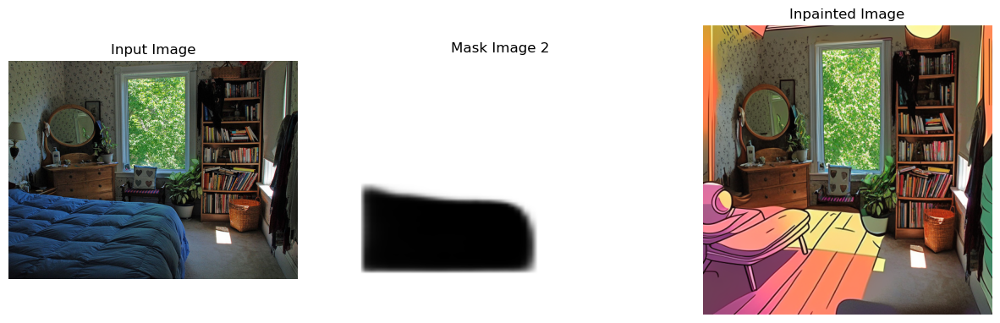

In [21]:
plot_3images(input_image, mask_image1, output, "Input Image", "Mask Image 2", "Inpainted Image")

In [41]:
output.save('./../imgs/eg_img_1_output_kandinsky.png')

In [43]:
output.size

(512, 512)

In [8]:
def scale_back_from_512(output, img):
    """
    Scale the output image back to the original size of the input image.
    """
    if isinstance(output, PIL.Image.Image):
        return output.resize(img.size, resample=PIL.Image.LANCZOS)
    elif isinstance(output, torch.Tensor):
        return torch.nn.functional.interpolate(
            output.unsqueeze(0), size=img.size[::-1], mode='bilinear', align_corners=False
        ).squeeze(0)
    else:
        raise ValueError("Unsupported output type")

In [ ]:

output = scale_back_from_512(output, input_image)
print(output.size)
output.save('./../imgs/eg_img_1_output_kandinsky.png')

In [45]:
output = pipe(
    prompt="sofa",
    image=input_image,
    mask_image=mask_image2,
    num_inference_steps=50,
    guidance_scale=7.5,
).images[0]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [46]:
output = scale_back_from_512(output, input_image)
print(output.size)
output.save('./../imgs/eg_img_1_output_sofa.png')

(640, 483)


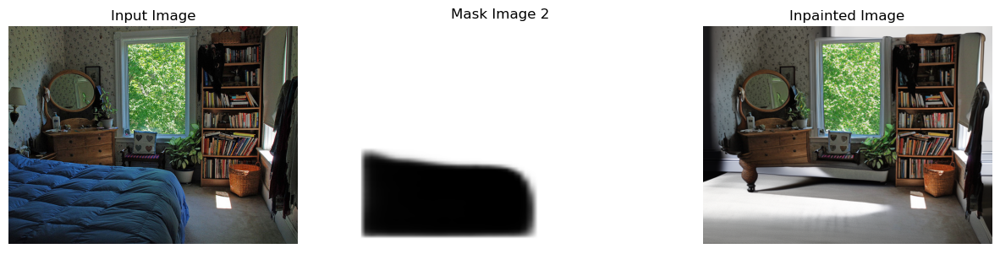

In [47]:
plot_3images(input_image, mask_image1, output, "Input Image", "Mask Image 2", "Inpainted Image")

In [ ]:
def scale_back_from_output(output, img):
    """
    Scale the output image back to the original size of the input image.
    """
    if isinstance(output, PIL.Image.Image):
        return output.resize(img.size, resample=PIL.Image.LANCZOS)
    elif isinstance(output, torch.Tensor):
        return torch.nn.functional.interpolate(
            output.unsqueeze(0), size=img.size[::-1], mode='bilinear', align_corners=False
        ).squeeze(0)
    else:
        raise ValueError("Unsupported output type")

def inpaint(img_path, prompt = "fill based on environment", steps = 50, guidance = 7.5 , pipe=pipe,model_name = "kandinsky-2-2"):
    file_name = os.path.basename(img_path)
    dir_name = os.path.dirname(img_path)
    img_name = file_name.split('.')[:-1]
    img_ext = file_name.split('.')[-1]
    print(f"Processing image: {img_path} with prompt: {prompt}, steps: {steps}, guidance: {guidance}")

    mask_path = os.path.join(dir_name, ''.join(img_name) + '_masked_2.' + img_ext)
    output_path = os.path.join(dir_name, ''.join(img_name) + '_model_'+ model_name.replace('-','_') +'_output.' + img_ext)
    print(f"Inpainting {img_path} with mask {mask_path} and saving to {output_path}")
    img = load_image(img_path)
    mask = load_image(mask_path)
    
    output = pipe(
        prompt=prompt,
        image=img,
        mask_image=mask,
        num_inference_steps=steps,
        guidance_scale=guidance,
    ).images[0]
    
    output = scale_back_from_output(output, img)
    output.save(output_path)
    print(f"Inpainting completed. Output saved to {output_path}")
    plot_3images(img, mask, output, "Input Image", "Mask Image", "Inpainted Image")
    return output

Processing image: ./../imgs/eg_img_2.png with prompt: fill based on environment, steps: 50, guidance: 7.5
Inpainting ./../imgs/eg_img_2.png with mask ./../imgs/eg_img_2_masked_2.png and saving to ./../imgs/eg_img_2_model_kandinsky_2_2_output.png


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Inpainting completed. Output saved to ./../imgs/eg_img_2_model_kandinsky_2_2_output.png


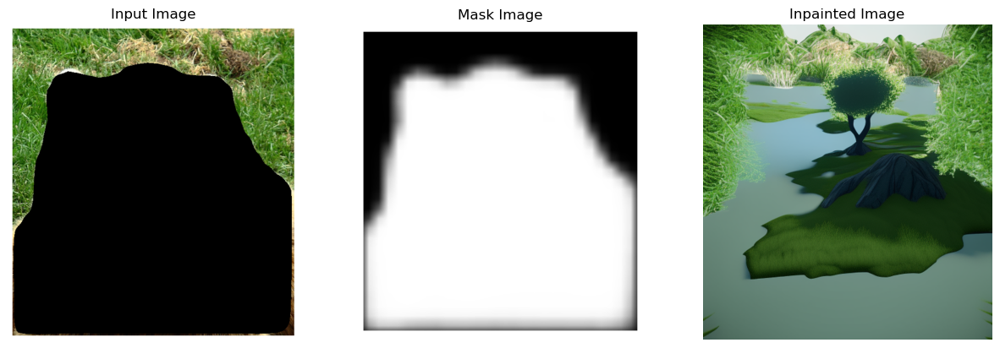

In [25]:
img_path = images_dir + '/eg_img_2.png'
output = inpaint(img_path)

Processing image: ./../imgs/eg_img_3.png with prompt: fill based on environment, steps: 50, guidance: 7.5
Inpainting ./../imgs/eg_img_3.png with mask ./../imgs/eg_img_3_masked_2.png and saving to ./../imgs/eg_img_3_model_kandinsky_2_2_output.png


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Inpainting completed. Output saved to ./../imgs/eg_img_3_model_kandinsky_2_2_output.png


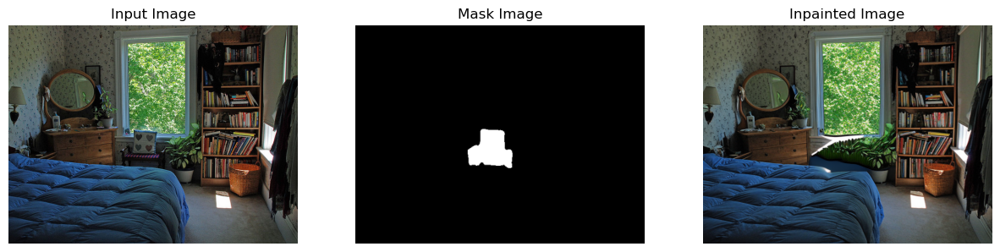

In [26]:

# img_path = images_dir + '/eg_img_3.png'
img_path = os.path.join(images_dir, 'eg_img_3.png')
output = inpaint(img_path)

Processing image: ./../imgs/eg_img_4.png with prompt: fill based on environment, steps: 50, guidance: 7.5
Inpainting ./../imgs/eg_img_4.png with mask ./../imgs/eg_img_4_masked_2.png and saving to ./../imgs/eg_img_4_model_kandinsky_2_2_output.png


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Inpainting completed. Output saved to ./../imgs/eg_img_4_model_kandinsky_2_2_output.png


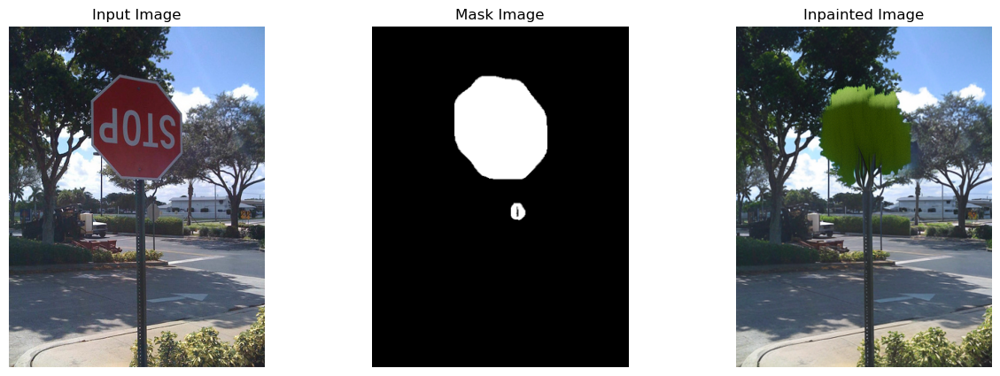

In [27]:
output = inpaint(os.path.join(images_dir, 'eg_img_4.png'))

Processing image: ./../imgs/eg_img_4.png with prompt: blend the image with the background, steps: 50, guidance: 7.5
Inpainting ./../imgs/eg_img_4.png with mask ./../imgs/eg_img_4_masked_2.png and saving to ./../imgs/eg_img_4_output.png


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Inpainting completed. Output saved to ./../imgs/eg_img_4_output.png


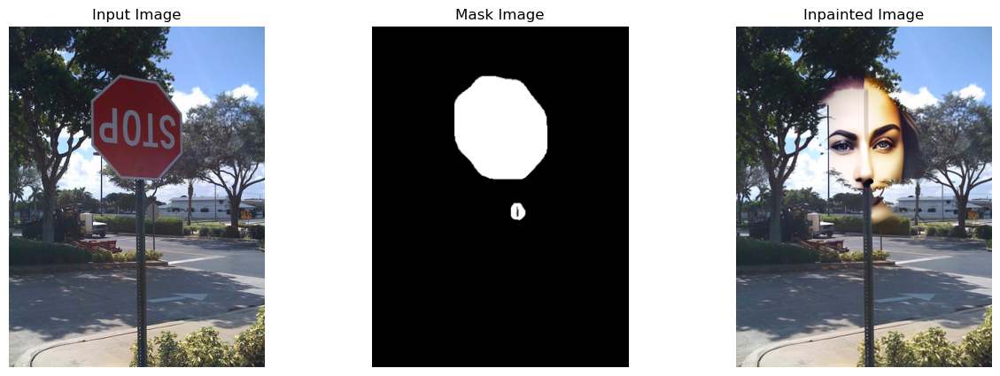

In [ ]:
output = inpaint(
    os.path.join(images_dir, 'eg_img_4.png'),
    prompt="blend the image with the background",
    )

## Change model
> stabilityai/stable-diffusion-2-1

In [28]:
pipe = AutoPipelineForInpainting.from_pretrained(
    "stabilityai/stable-diffusion-2-1", 
    torch_dtype=torch.float16
)

pipe.enable_model_cpu_offload()
pipe = pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

It seems like you have activated model offloading by calling `enable_model_cpu_offload`, but are now manually moving the pipeline to GPU. It is strongly recommended against doing so as memory gains from offloading are likely to be lost. Offloading automatically takes care of moving the individual components vae, text_encoder, tokenizer, unet, scheduler, safety_checker, feature_extractor, image_encoder to GPU when needed. To make sure offloading works as expected, you should consider moving the pipeline back to CPU: `pipeline.to('cpu')` or removing the move altogether if you use offloading.


Processing image: ./../imgs/eg_img_4.png with prompt: fill based on environment, steps: 50, guidance: 7.5
Inpainting ./../imgs/eg_img_4.png with mask ./../imgs/eg_img_4_masked_2.png and saving to ./../imgs/eg_img_4_model_stable_diffusion_2_1_output.png


  0%|          | 0/50 [00:00<?, ?it/s]

Inpainting completed. Output saved to ./../imgs/eg_img_4_model_stable_diffusion_2_1_output.png


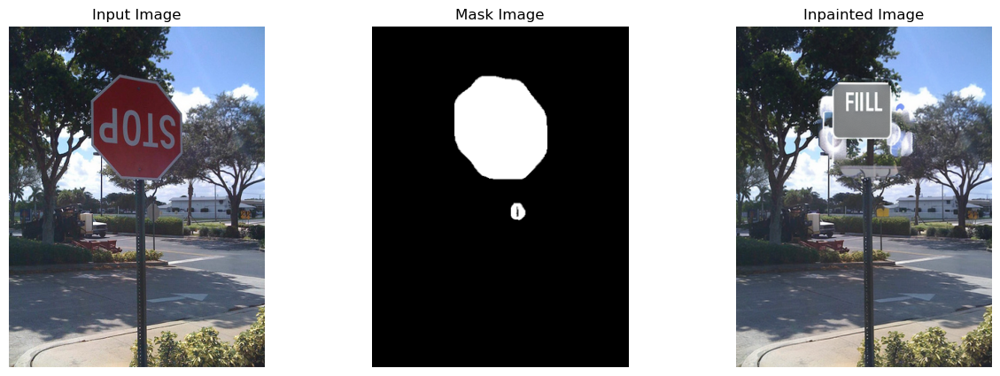

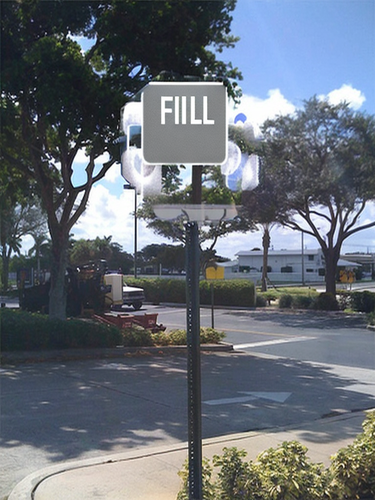

In [29]:
inpaint(
    os.path.join(images_dir, 'eg_img_4.png'),
    # prompt="blend the image with the background",
    pipe=pipe,
    model_name = "stable-diffusion-2-1",
)

Processing image: ./../imgs/eg_img_3.png with prompt: fill based on environment, steps: 50, guidance: 7.5
Inpainting ./../imgs/eg_img_3.png with mask ./../imgs/eg_img_3_masked_2.png and saving to ./../imgs/eg_img_3_model_stable_diffusion_2_1_output.png


  0%|          | 0/50 [00:00<?, ?it/s]

Inpainting completed. Output saved to ./../imgs/eg_img_3_model_stable_diffusion_2_1_output.png


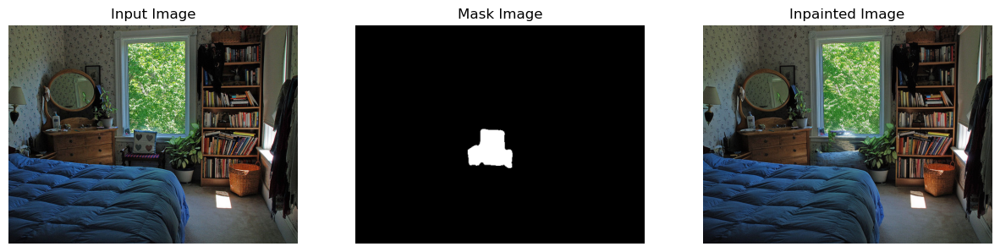

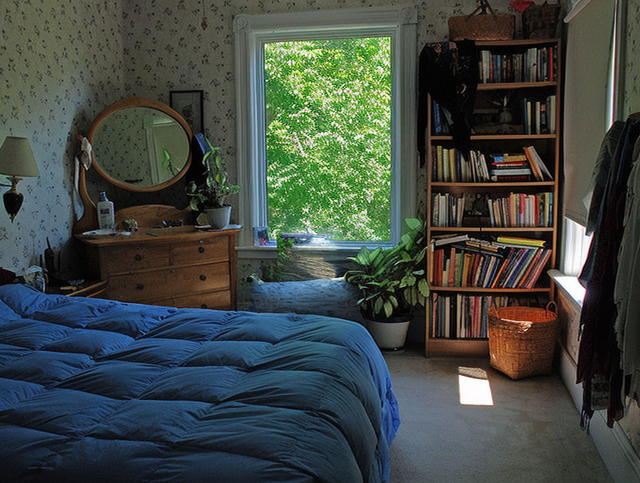

In [30]:
inpaint(
    os.path.join(images_dir, 'eg_img_3.png'),
    # prompt="blend the image with the background",
    pipe=pipe,
    model_name = "stable-diffusion-2-1",
)

## move to next best model

> stabilityai/stable-diffusion-xl-base-1.0

In [32]:
pipe = AutoPipelineForInpainting.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", 
    torch_dtype=torch.float16
)

pipe.enable_model_cpu_offload()
pipe = pipe.to("cuda")

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

text_encoder_2/model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

vae_1_0/diffusion_pytorch_model.safetens(…):   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

It seems like you have activated model offloading by calling `enable_model_cpu_offload`, but are now manually moving the pipeline to GPU. It is strongly recommended against doing so as memory gains from offloading are likely to be lost. Offloading automatically takes care of moving the individual components vae, text_encoder, text_encoder_2, tokenizer, tokenizer_2, unet, image_encoder, feature_extractor, scheduler to GPU when needed. To make sure offloading works as expected, you should consider moving the pipeline back to CPU: `pipeline.to('cpu')` or removing the move altogether if you use offloading.


Processing image: ./../imgs/eg_img_3.png with prompt: fill based on environment, steps: 50, guidance: 7.5
Inpainting ./../imgs/eg_img_3.png with mask ./../imgs/eg_img_3_masked_2.png and saving to ./../imgs/eg_img_3_model_stable_diffusion_xl_base_1_output.png


  0%|          | 0/49 [00:00<?, ?it/s]

Inpainting completed. Output saved to ./../imgs/eg_img_3_model_stable_diffusion_xl_base_1_output.png


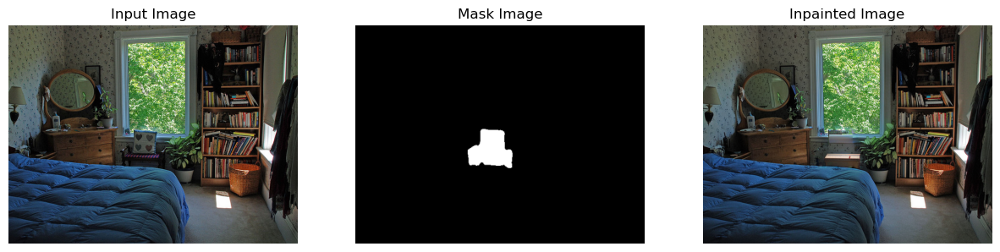

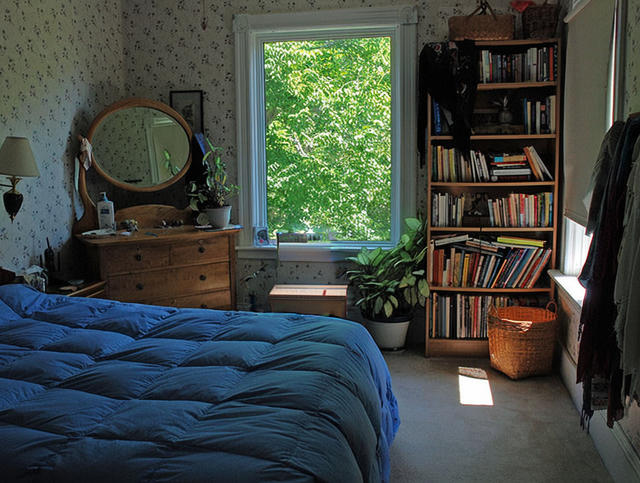

In [33]:
inpaint(
    os.path.join(images_dir, 'eg_img_3.png'),
    # prompt="blend the image with the background",
    pipe=pipe,
    model_name = "stable-diffusion-xl-base-1",
)

Processing image: ./../imgs/eg_img_4.png with prompt: fill based on environment, steps: 50, guidance: 7.5
Inpainting ./../imgs/eg_img_4.png with mask ./../imgs/eg_img_4_masked_2.png and saving to ./../imgs/eg_img_4_model_stable_diffusion_xl_base_1_output.png


  0%|          | 0/49 [00:00<?, ?it/s]

Inpainting completed. Output saved to ./../imgs/eg_img_4_model_stable_diffusion_xl_base_1_output.png


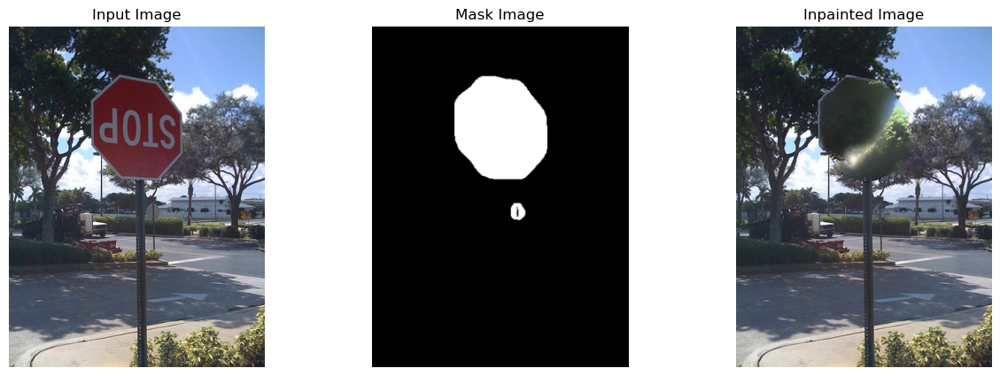

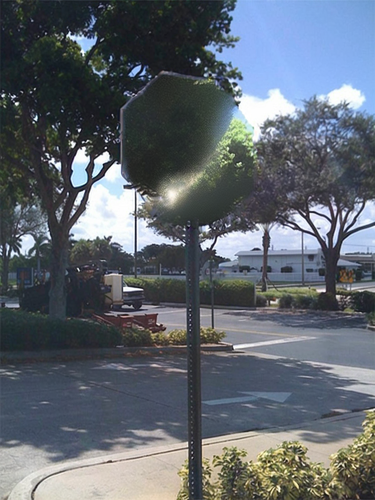

In [34]:
inpaint(
    os.path.join(images_dir, 'eg_img_4.png'),
    # prompt="blend the image with the background",
    pipe=pipe,
    model_name = "stable-diffusion-xl-base-1",
)

In [39]:
pipe = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting", 
    torch_dtype=torch.float16
)

model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

merges.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/748 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/552 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/kaifalam/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /home/kaifalam/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /home/kaifalam/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /home/kaifalam/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


In [41]:
inpaint(
    os.path.join(images_dir, 'eg_img_4.png'),
    # prompt="blend the image with the background",
    pipe=pipe,
    model_name = "runwayml-stable-diffusion",
)

Processing image: ./../imgs/eg_img_4.png with prompt: fill based on environment, steps: 50, guidance: 7.5
Inpainting ./../imgs/eg_img_4.png with mask ./../imgs/eg_img_4_masked_2.png and saving to ./../imgs/eg_img_4_model_runwayml_stable_diffusion_output.png


ValueError: Incorrect path or URL. URLs must start with `http://` or `https://`, and ./../imgs/eg_img_4.png is not a valid path.